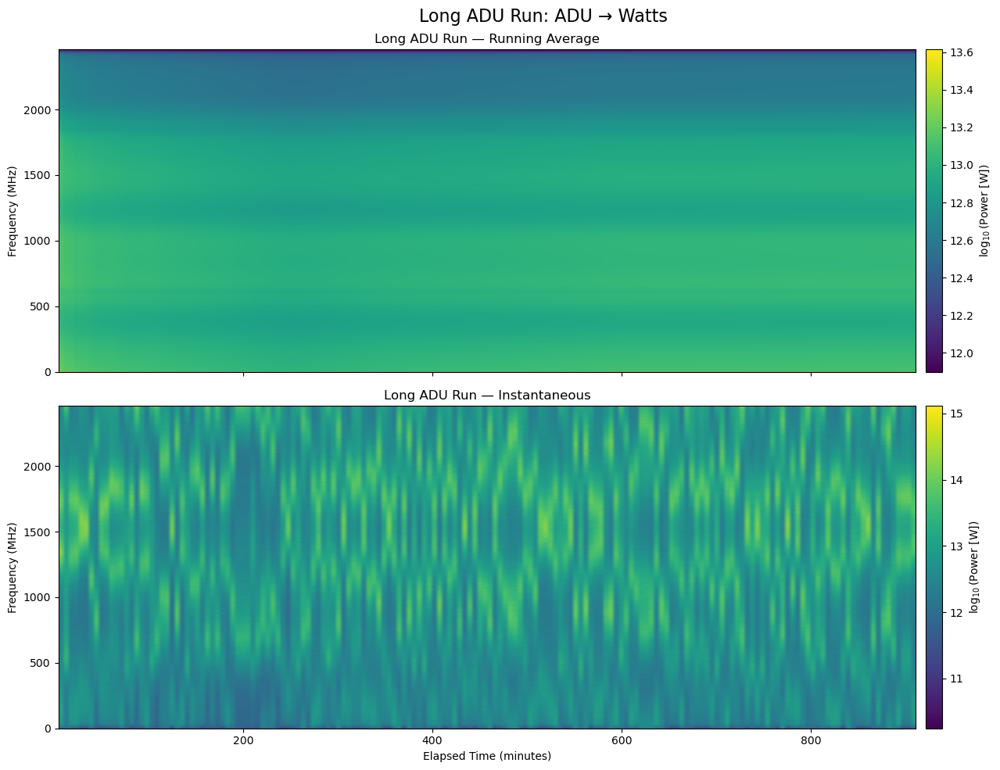

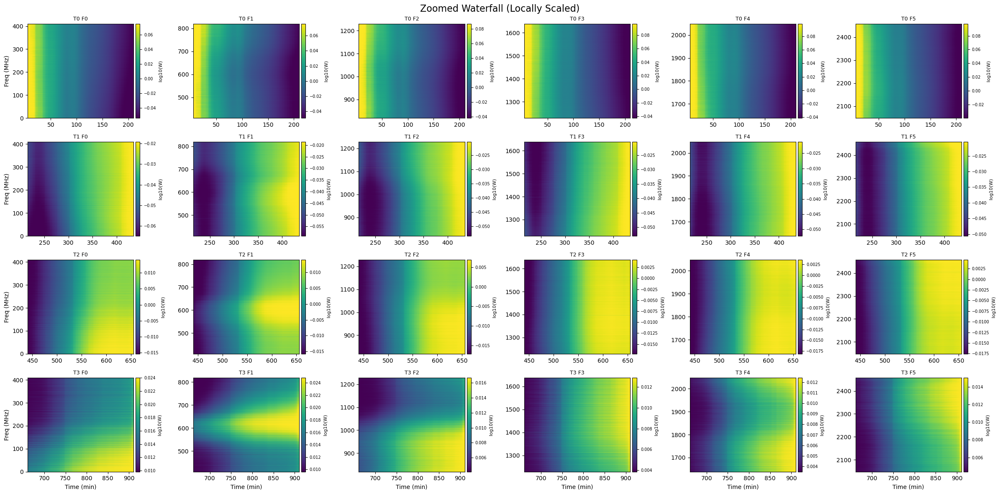

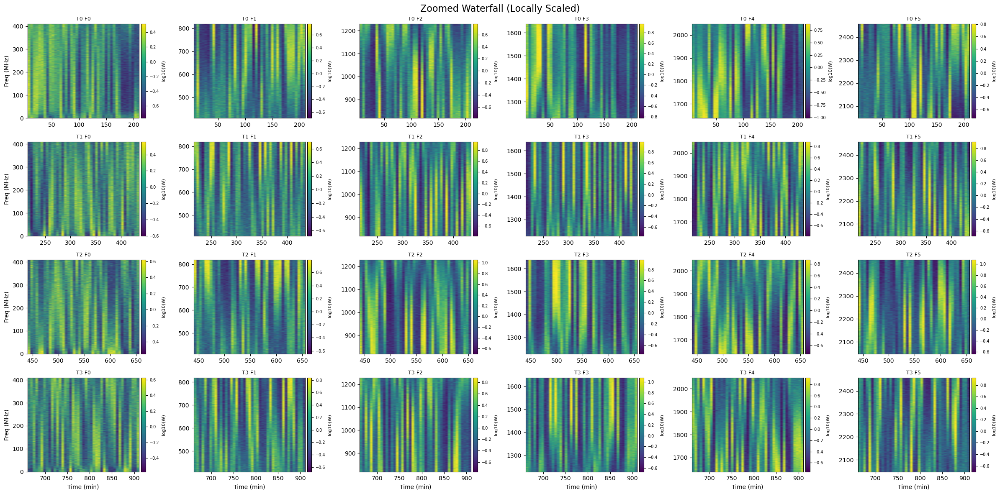

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER HARDWARE SETTINGS =================
NBITS = 12          # ADC resolution (e.g. 12, 14, 16)
VFS   = 1.0         # Full-scale voltage at ADC input (Volts, peak)
RIN   = 50.0        # System impedance (Ohms)
EPS   = 1e-30       # Log safety floor
# ==========================================================


# ---------- ADU -> Watts conversion ----------
def adu_to_watts(spec_adu, nbits=NBITS, vfs=VFS, R=RIN):
    scale = vfs / (2**(nbits - 1))   # ADU -> Volts
    volts = spec_adu * scale
    return (volts**2) / R            # V^2 / R -> Watts


# ---------- Load continuous dataset ----------
def load_continuous_adu(base_dir):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError(f"No npz files found in {base_dir}")

    records = []
    for f in files:
        d = np.load(f)
        records.append((float(d["elapsed"]), f))

    records.sort(key=lambda x: x[0])

    elapsed_spectra = []
    inst_spectra = []
    times = []
    F = None

    for elapsed, f in records:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size

        inst = d["inst_raw"].reshape(-1, nchan)
        avg  = d["avg_raw"].reshape(-1, nchan)

        # instantaneous snapshot
        inst_phys = adu_to_watts(inst[0])

        # accumulated spectrum at file time
        avg_phys  = adu_to_watts(avg[-1])

        inst_spectra.append(inst_phys)
        elapsed_spectra.append(avg_phys)
        times.append(elapsed)

    return F, np.array(times), np.array(elapsed_spectra), np.array(inst_spectra)


# ---------- Global waterfall (for overview) ----------
def plot_waterfall(ax, F, times, spectra, title):
    log_spec = np.log10(spectra + EPS).T

    im = ax.imshow(
        log_spec,
        aspect="auto",
        origin="lower",
        extent=[times[0]/60, times[-1]/60, F[0], F[-1]],
        cmap="viridis"
    )

    ax.set_ylabel("Frequency (MHz)")
    ax.set_title(title)

    cbar = plt.colorbar(im, ax=ax, pad=0.01)
    cbar.set_label(r"$\log_{10}(\mathrm{Power\ [W]})$")


def plot_continuous_dataset(base_dir, label):
    F, times, elapsed_spec, inst_spec = load_continuous_adu(base_dir)

    fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

    plot_waterfall(axes[0], F, times, elapsed_spec, f"{label} — Running Average")
    plot_waterfall(axes[1], F, times, inst_spec,  f"{label} — Instantaneous")

    axes[1].set_xlabel("Elapsed Time (minutes)")
    fig.suptitle(f"{label}: ADU → Watts", fontsize=16)

    plt.tight_layout()
    plt.show()

    return F, times, elapsed_spec, inst_spec


# ---------- Robust local scaling ----------
def robust_limits(data, lo=5, hi=95):
    vmin = np.percentile(data, lo)
    vmax = np.percentile(data, hi)
    if vmin == vmax:
        vmax = vmin + 1e-12
    return vmin, vmax


# ---------- Optional bandpass removal (for visibility) ----------
def remove_bandpass(spec2d):
    band = np.median(spec2d, axis=0)
    band[band == 0] = 1
    return spec2d / band


# ---------- Zoom grid with dynamic scaling ----------
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_zoom_grid(F, times, spectra, nfreq=5, ntime=4, detrend=True):
    if detrend:
        spectra = remove_bandpass(spectra)

    log_spec = np.log10(spectra + EPS)

    nf = len(F)
    nt = len(times)

    f_edges = np.linspace(0, nf, nfreq + 1, dtype=int)
    t_edges = np.linspace(0, nt, ntime + 1, dtype=int)

    fig, axes = plt.subplots(
        ntime, nfreq,
        figsize=(4*nfreq, 3*ntime),
        squeeze=False
    )

    for i in range(ntime):
        for j in range(nfreq):
            ax = axes[i, j]

            t0, t1 = t_edges[i], t_edges[i+1]
            f0, f1 = f_edges[j], f_edges[j+1]

            tile = log_spec[t0:t1, f0:f1].T

            vmin, vmax = robust_limits(tile)

            im = ax.imshow(
                tile,
                aspect="auto",
                origin="lower",
                extent=[
                    times[t0]/60, times[t1-1]/60,
                    F[f0], F[f1-1]
                ],
                vmin=vmin,
                vmax=vmax,
                cmap="viridis"
            )

            # ---- attach a colorbar to THIS subplot ----
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="4%", pad=0.05)
            cbar = plt.colorbar(im, cax=cax)
            cbar.ax.tick_params(labelsize=7)
            cbar.set_label("log10(W)", fontsize=8)

            ax.set_title(f"T{i} F{j}", fontsize=9)

            if i == ntime - 1:
                ax.set_xlabel("Time (min)")
            if j == 0:
                ax.set_ylabel("Freq (MHz)")

    fig.suptitle("Zoomed Waterfall (Locally Scaled)", fontsize=16)
    plt.tight_layout()
    plt.show()


# ===================== RUN =====================

BASE_DIR = "./"   # directory containing the .npz files

F, times, elapsed_spec, inst_spec = plot_continuous_dataset(BASE_DIR, "Long ADU Run")

# High-contrast zoom views
plot_zoom_grid(F, times, elapsed_spec, nfreq=6, ntime=4, detrend=True)
plot_zoom_grid(F, times, inst_spec,   nfreq=6, ntime=4, detrend=True)



Testing these bins:
  Bin  2816 -> 211.206446 MHz
  Bin  2923 -> 219.231690 MHz
  Bin 14187 -> 1064.057472 MHz
  Bin 14379 -> 1078.457912 MHz
  Bin 21445 -> 1608.424085 MHz
  Bin 22851 -> 1713.877303 MHz
  Bin 25356 -> 1901.758037 MHz
  Bin 28132 -> 2109.964391 MHz


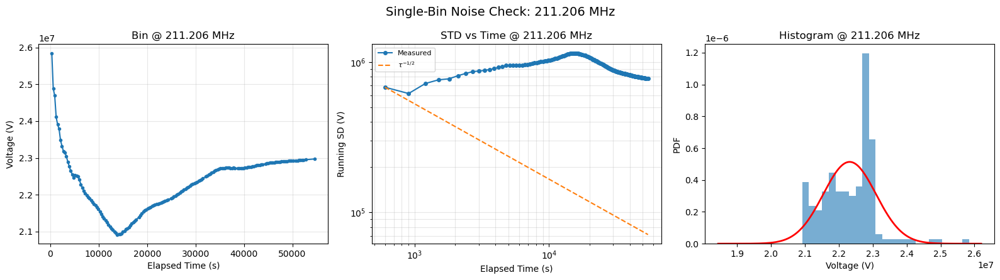

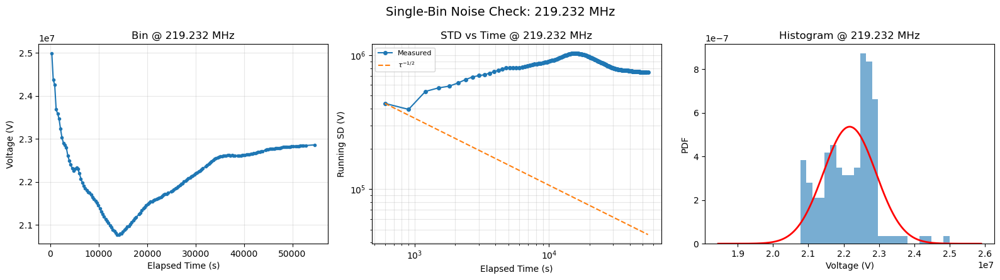

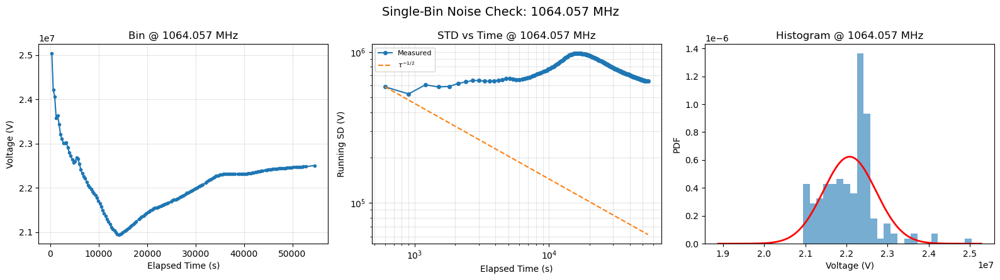

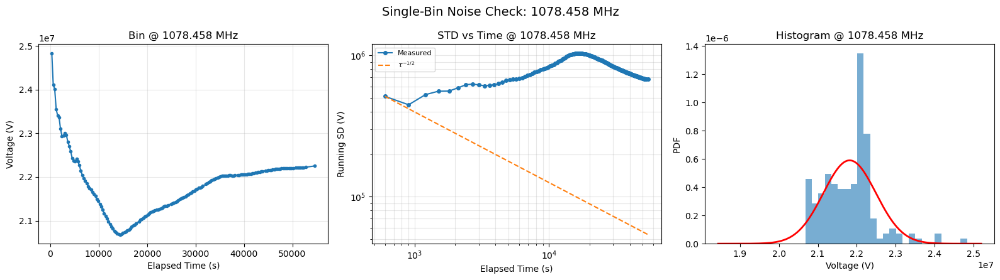

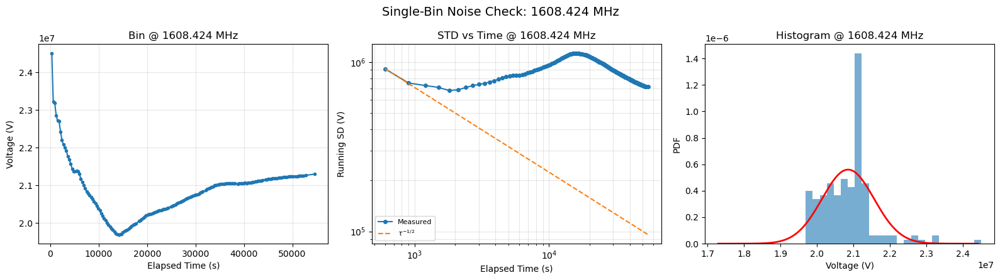

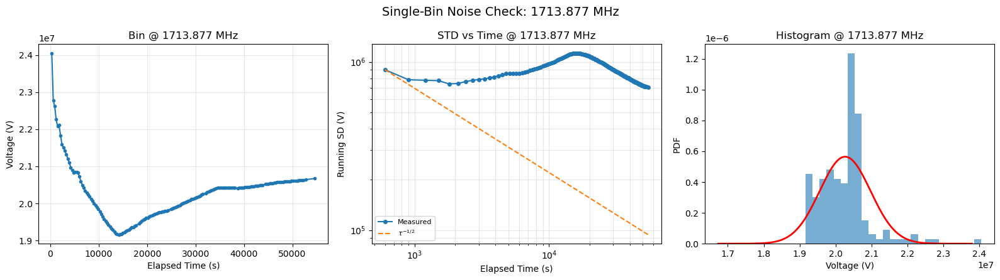

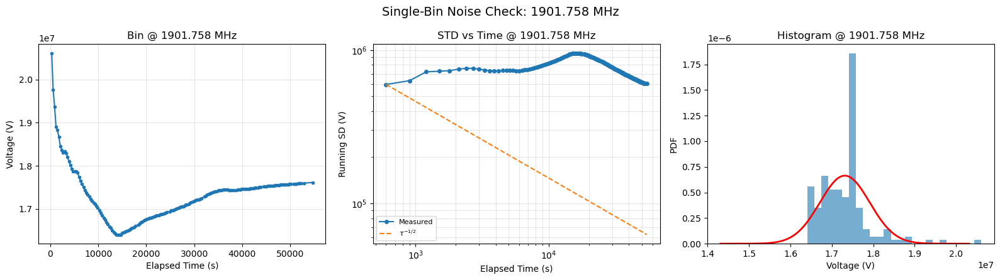

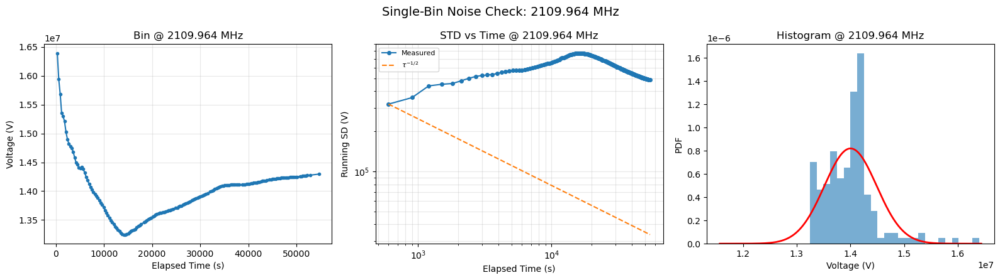

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import glob
from scipy.stats import norm

# ================= USER SETTINGS =================
NBITS = 12
VFS = 1.0
N_BINS_TO_TEST = 8        # how many individual frequency bins to inspect
RANDOM_SEED = 42
# =================================================


# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale


# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        try:
            d = np.load(f)
            rec.append((float(d["elapsed"]), f))
        except Exception as e:
            print(f"Skipping broken file: {f} ({e})")

    if not rec:
        raise RuntimeError("No readable .npz files found")

    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)

        volts = adu_to_volts(avg[-1])

        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)


# ---------- PICK INDIVIDUAL BINS ----------
def pick_bins(F, n_bins, seed=42):
    rng = np.random.default_rng(seed)
    idx = np.sort(rng.choice(len(F), size=min(n_bins, len(F)), replace=False))
    return idx


# ---------- RUNNING STD FOR ONE BIN ----------
def running_std(x):
    out = np.full(len(x), np.nan)
    for i in range(2, len(x) + 1):
        out[i - 1] = np.std(x[:i], ddof=1)
    return out


# ---------- PLOT BIN TIME SERIES ----------
def plot_bin_evolution(ax, times, spectra, F, bin_idx):
    y = spectra[:, bin_idx]
    ax.plot(times, y, 'o-', ms=3)
    ax.set_title(f"Bin @ {F[bin_idx]:.3f} MHz")
    ax.set_xlabel("Elapsed Time (s)")
    ax.set_ylabel("Voltage (V)")
    ax.grid(True, alpha=0.3)


# ---------- PLOT BIN STD VS TIME ----------
def plot_bin_radiometer(ax, times, spectra, F, bin_idx):
    y = spectra[:, bin_idx]
    sigma = running_std(y)

    valid = np.isfinite(sigma) & (times > 0)
    t = times[valid]
    s = sigma[valid]

    ax.loglog(t, s, 'o-', label="Measured", ms=4)

    if len(s) > 0:
        ref = s[0] * (t / t[0])**(-0.5)
        ax.loglog(t, ref, '--', label=r'$\tau^{-1/2}$')

    ax.set_title(f"STD vs Time @ {F[bin_idx]:.3f} MHz")
    ax.set_xlabel("Elapsed Time (s)")
    ax.set_ylabel("Running SD (V)")
    ax.legend(fontsize=8)
    ax.grid(True, which="both", alpha=0.3)


# ---------- PLOT HISTOGRAM ----------
def plot_bin_hist(ax, spectra, F, bin_idx):
    y = spectra[:, bin_idx]
    mu, std = np.mean(y), np.std(y)

    ax.hist(y, bins=25, density=True, alpha=0.6)

    if std > 0:
        x = np.linspace(mu - 5*std, mu + 5*std, 400)
        ax.plot(x, norm.pdf(x, mu, std), 'r', lw=2)

    ax.set_title(f"Histogram @ {F[bin_idx]:.3f} MHz")
    ax.set_xlabel("Voltage (V)")
    ax.set_ylabel("PDF")


# ---------- MASTER ANALYSIS ----------
def analyze_individual_bins(F, times, spectra, n_bins=N_BINS_TO_TEST):
    bin_indices = pick_bins(F, n_bins, seed=RANDOM_SEED)

    print("\nTesting these bins:")
    for b in bin_indices:
        print(f"  Bin {b:5d} -> {F[b]:.6f} MHz")

    for b in bin_indices:
        fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
        fig.suptitle(f"Single-Bin Noise Check: {F[b]:.3f} MHz", fontsize=14)

        plot_bin_evolution(axes[0], times, spectra, F, b)
        plot_bin_radiometer(axes[1], times, spectra, F, b)
        plot_bin_hist(axes[2], spectra, F, b)

        plt.tight_layout()
        plt.show()


# ================= RUN EVERYTHING =================
F, times, spectra = load_dataset(".")
analyze_individual_bins(F, times, spectra)


Testing these bins:
  Bin  2816 -> 211.206446 MHz
  Bin  2923 -> 219.231690 MHz
  Bin 14187 -> 1064.057472 MHz
  Bin 14379 -> 1078.457912 MHz
  Bin 21445 -> 1608.424085 MHz
  Bin 22851 -> 1713.877303 MHz
  Bin 25356 -> 1901.758037 MHz
  Bin 28132 -> 2109.964391 MHz


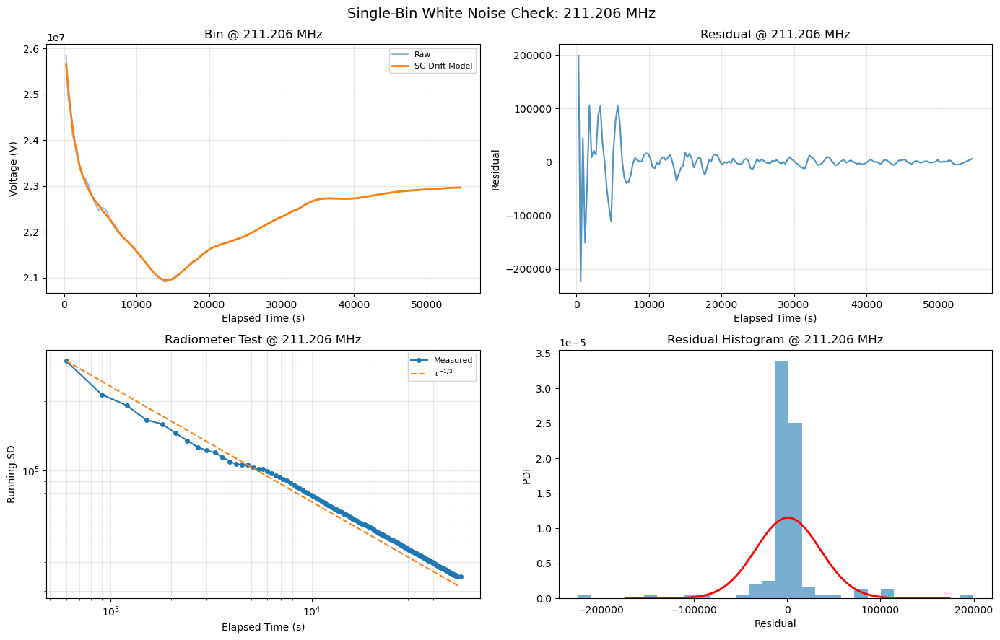

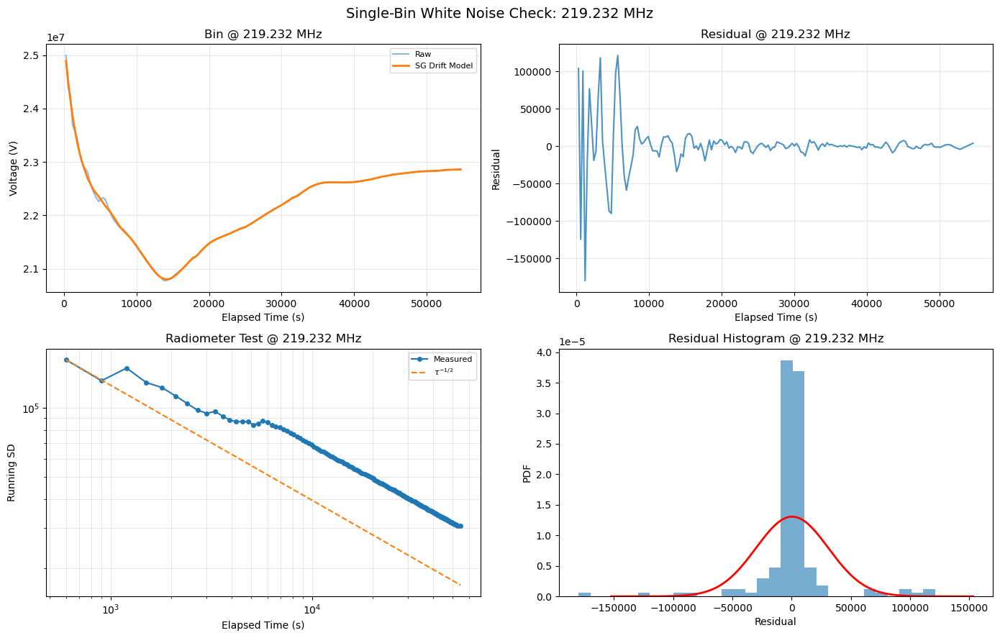

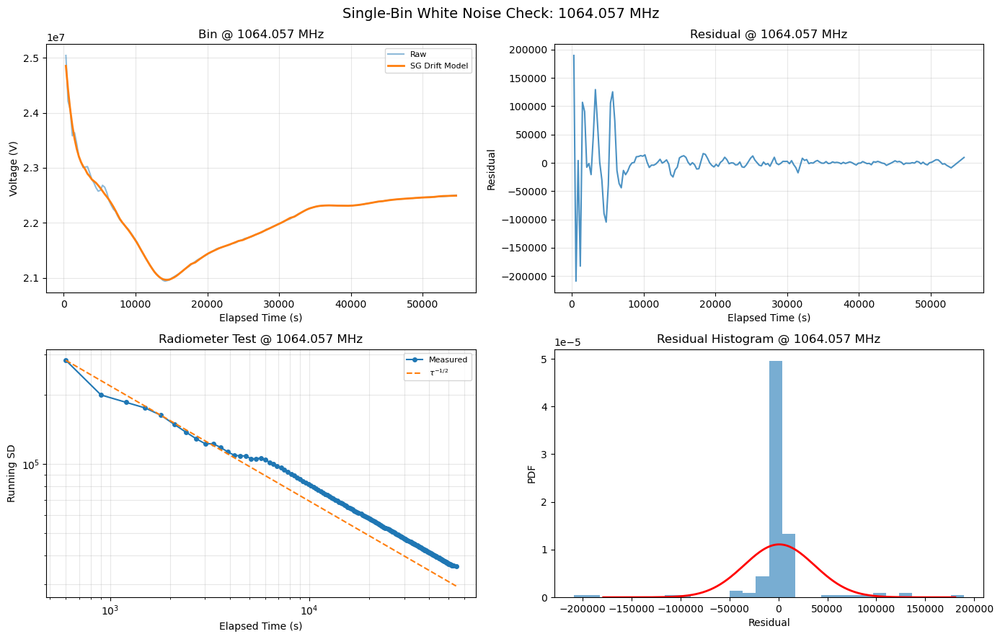

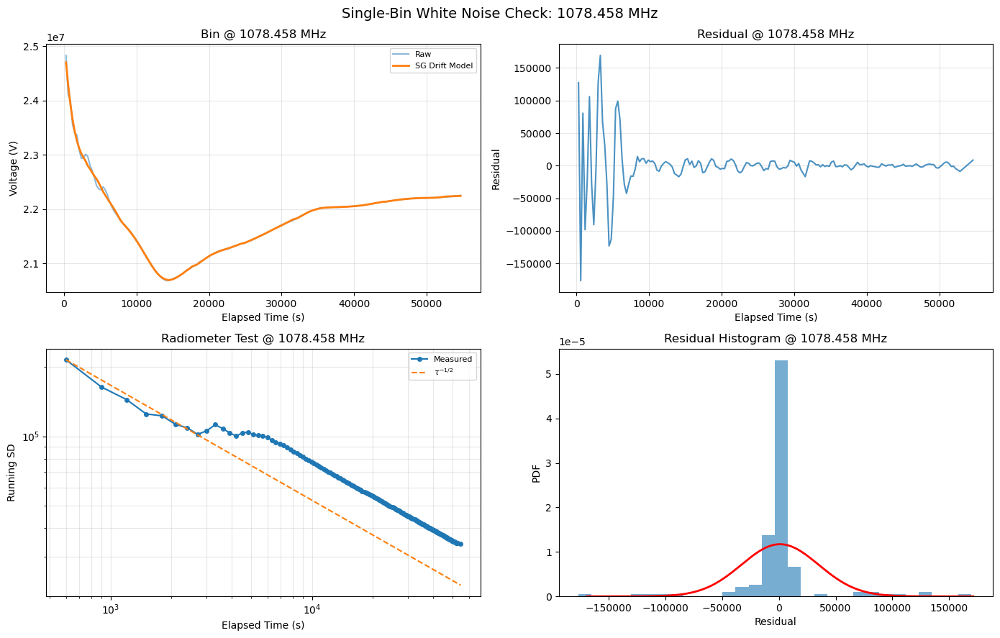

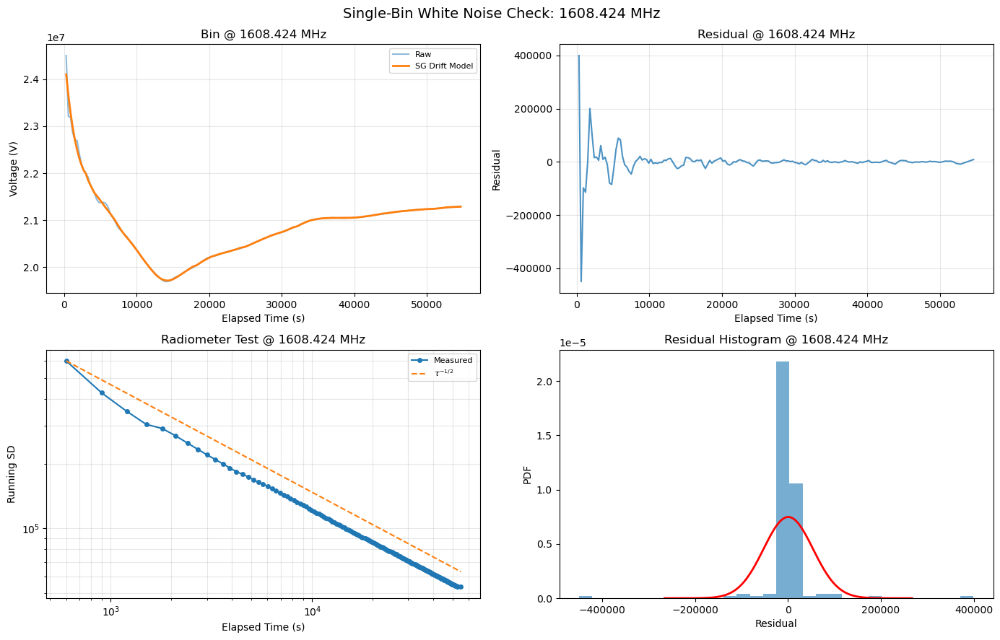

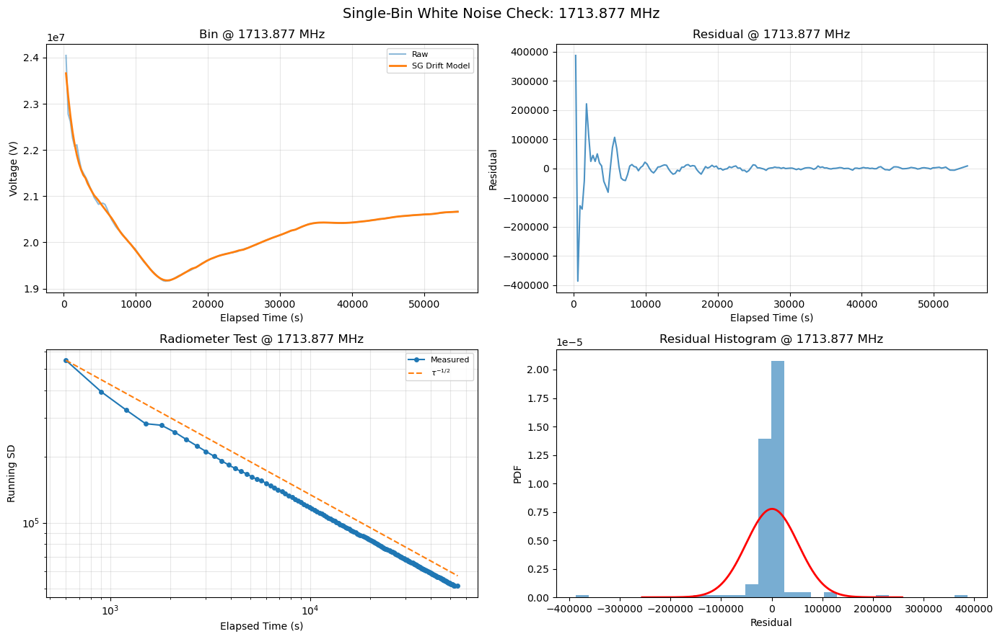

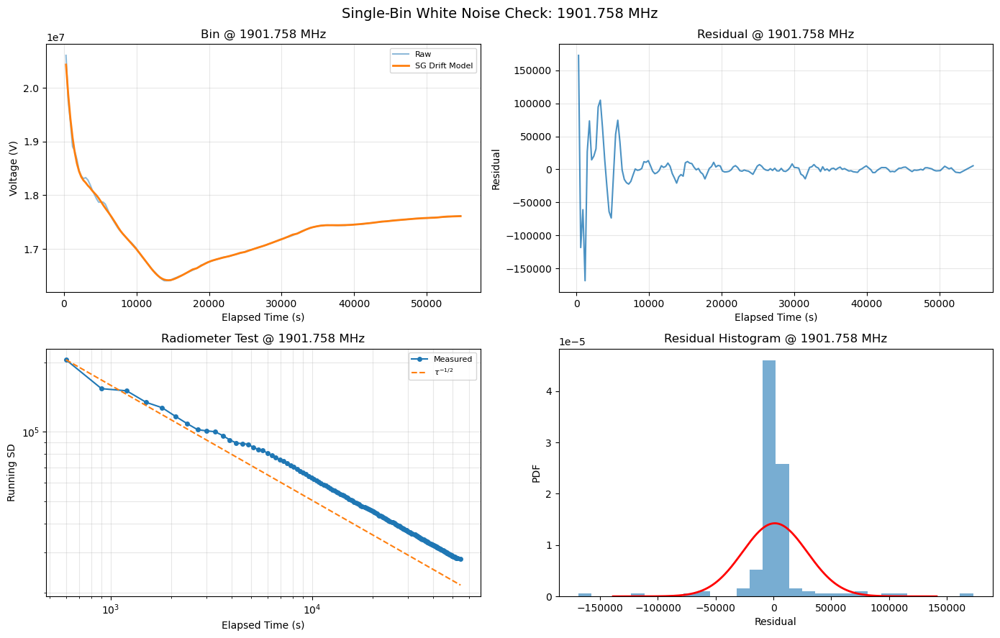

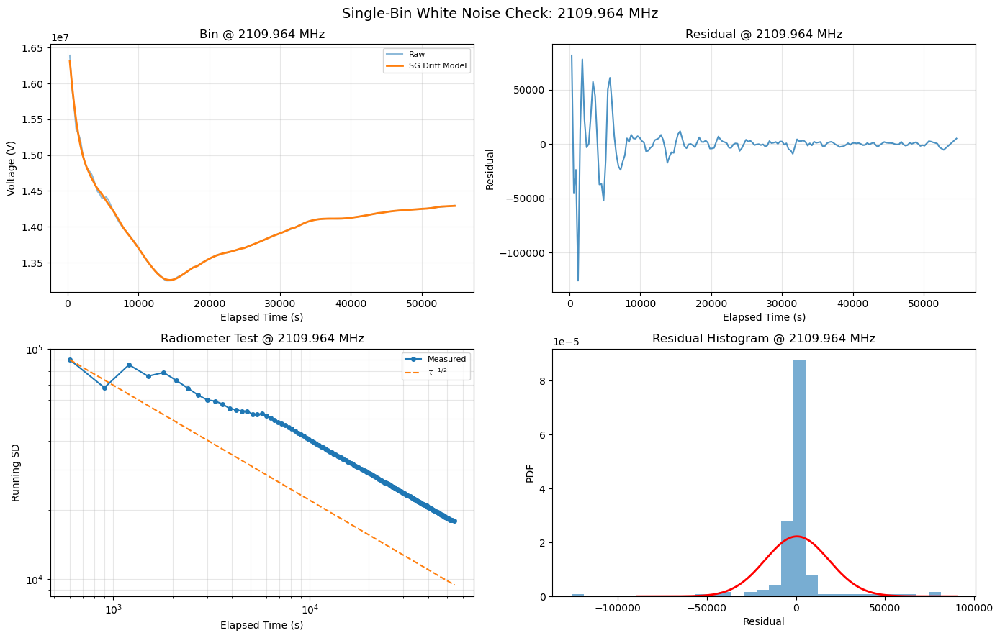

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import glob
from scipy.stats import norm
from scipy.signal import savgol_filter

# ================= USER SETTINGS =================
NBITS = 12
VFS = 1.0
N_BINS_TO_TEST = 8
RANDOM_SEED = 42

SG_WINDOW_FRAC = 0.10     # use 1/10 of samples
SG_POLY_ORDER = 3         # stiff low-order drift model
NORMALIZE = False         # set True if you want unit variance residuals
# =================================================


# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale


# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        try:
            d = np.load(f)
            rec.append((float(d["elapsed"]), f))
        except Exception as e:
            print(f"Skipping broken file: {f} ({e})")

    if not rec:
        raise RuntimeError("No readable .npz files found")

    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)

        volts = adu_to_volts(avg[-1])

        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)


# ---------- PICK INDIVIDUAL BINS ----------
def pick_bins(F, n_bins, seed=42):
    rng = np.random.default_rng(seed)
    idx = np.sort(rng.choice(len(F), size=min(n_bins, len(F)), replace=False))
    return idx


# ---------- RUNNING STD ----------
def running_std(x):
    out = np.full(len(x), np.nan)
    for i in range(2, len(x) + 1):
        out[i - 1] = np.std(x[:i], ddof=1)
    return out


# ---------- STIFF SG DETREND ----------
def detrend_time_series_sg(y, window_frac=0.10, polyorder=3):
    n = len(y)

    win = int(n * window_frac)

    # must be odd
    if win % 2 == 0:
        win += 1

    # must be > polyorder
    if win <= polyorder:
        win = polyorder + 3
        if win % 2 == 0:
            win += 1

    # cannot exceed data length
    if win >= n:
        win = n - 1 if n % 2 == 0 else n
        if win <= polyorder:
            return y - np.mean(y), np.full_like(y, np.mean(y))

    trend = savgol_filter(y, window_length=win, polyorder=polyorder)
    residual = y - trend

    return residual, trend


# ---------- OPTIONAL NORMALIZATION ----------
def normalize_series(y):
    std = np.std(y)
    if std == 0:
        return y
    return y / std


# ---------- PLOT BIN TIME SERIES ----------
def plot_bin_evolution(ax, times, spectra, F, bin_idx):
    y = spectra[:, bin_idx]
    residual, trend = detrend_time_series_sg(
        y, window_frac=SG_WINDOW_FRAC, polyorder=SG_POLY_ORDER
    )

    ax.plot(times, y, alpha=0.5, label="Raw")
    ax.plot(times, trend, lw=2, label="SG Drift Model")
    ax.set_title(f"Bin @ {F[bin_idx]:.3f} MHz")
    ax.set_xlabel("Elapsed Time (s)")
    ax.set_ylabel("Voltage (V)")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)


# ---------- PLOT DETRENDED RESIDUAL ----------
def plot_bin_residual(ax, times, spectra, F, bin_idx):
    y = spectra[:, bin_idx]
    residual, trend = detrend_time_series_sg(
        y, window_frac=SG_WINDOW_FRAC, polyorder=SG_POLY_ORDER
    )

    if NORMALIZE:
        residual = normalize_series(residual)

    ax.plot(times, residual, alpha=0.8)
    ax.set_title(f"Residual @ {F[bin_idx]:.3f} MHz")
    ax.set_xlabel("Elapsed Time (s)")
    ax.set_ylabel("Residual")
    ax.grid(True, alpha=0.3)


# ---------- PLOT RADIOMETER TEST ----------
def plot_bin_radiometer(ax, times, spectra, F, bin_idx):
    y = spectra[:, bin_idx]

    residual, trend = detrend_time_series_sg(
        y, window_frac=SG_WINDOW_FRAC, polyorder=SG_POLY_ORDER
    )

    if NORMALIZE:
        residual = normalize_series(residual)

    sigma = running_std(residual)

    valid = np.isfinite(sigma) & (times > 0)
    t = times[valid]
    s = sigma[valid]

    ax.loglog(t, s, 'o-', ms=4, label="Measured")

    if len(s) > 0:
        ref = s[0] * (t / t[0])**(-0.5)
        ax.loglog(t, ref, '--', label=r'$\tau^{-1/2}$')

    ax.set_title(f"Radiometer Test @ {F[bin_idx]:.3f} MHz")
    ax.set_xlabel("Elapsed Time (s)")
    ax.set_ylabel("Running SD")
    ax.legend(fontsize=8)
    ax.grid(True, which="both", alpha=0.3)


# ---------- PLOT HISTOGRAM ----------
def plot_bin_hist(ax, spectra, F, bin_idx):
    y = spectra[:, bin_idx]

    residual, trend = detrend_time_series_sg(
        y, window_frac=SG_WINDOW_FRAC, polyorder=SG_POLY_ORDER
    )

    if NORMALIZE:
        residual = normalize_series(residual)

    mu, std = np.mean(residual), np.std(residual)

    ax.hist(residual, bins=30, density=True, alpha=0.6)

    if std > 0:
        x = np.linspace(mu - 5*std, mu + 5*std, 400)
        ax.plot(x, norm.pdf(x, mu, std), 'r', lw=2)

    ax.set_title(f"Residual Histogram @ {F[bin_idx]:.3f} MHz")
    ax.set_xlabel("Residual")
    ax.set_ylabel("PDF")


# ---------- MASTER ANALYSIS ----------
def analyze_individual_bins(F, times, spectra, n_bins=N_BINS_TO_TEST):
    bin_indices = pick_bins(F, n_bins, seed=RANDOM_SEED)

    print("\nTesting these bins:")
    for b in bin_indices:
        print(f"  Bin {b:5d} -> {F[b]:.6f} MHz")

    for b in bin_indices:
        fig, axes = plt.subplots(2, 2, figsize=(14, 9))
        fig.suptitle(f"Single-Bin White Noise Check: {F[b]:.3f} MHz", fontsize=14)

        plot_bin_evolution(axes[0, 0], times, spectra, F, b)
        plot_bin_residual(axes[0, 1], times, spectra, F, b)
        plot_bin_radiometer(axes[1, 0], times, spectra, F, b)
        plot_bin_hist(axes[1, 1], spectra, F, b)

        plt.tight_layout()
        plt.show()


# ================= RUN EVERYTHING =================
F, times, spectra = load_dataset(".")
analyze_individual_bins(F, times, spectra)

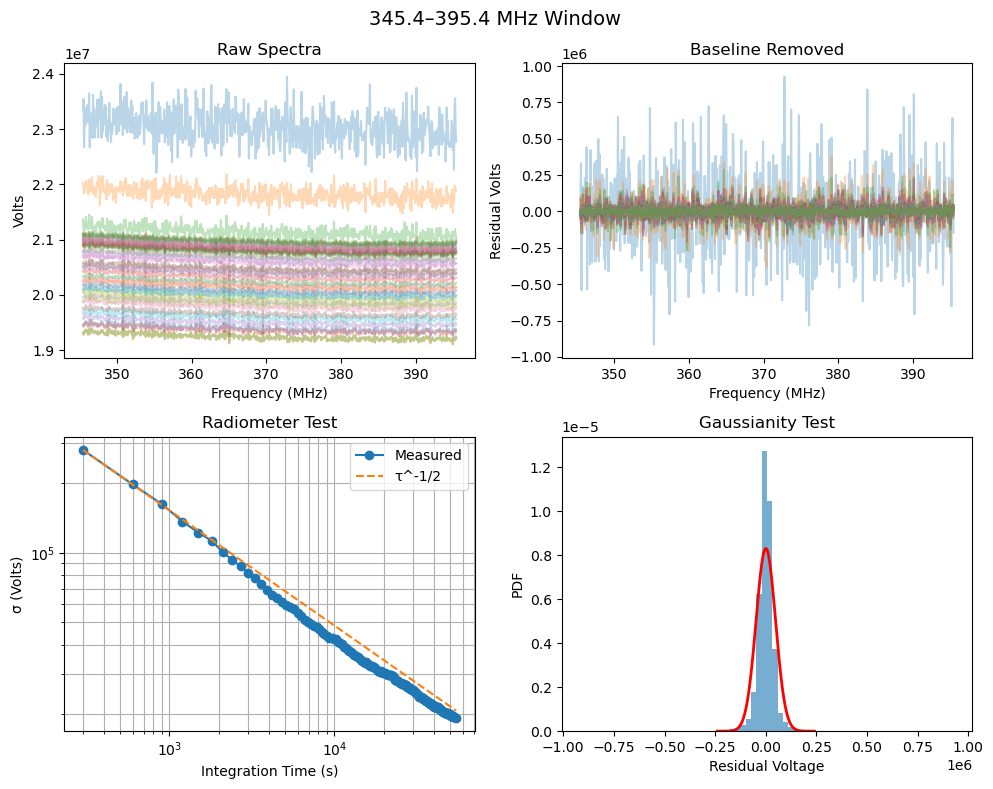

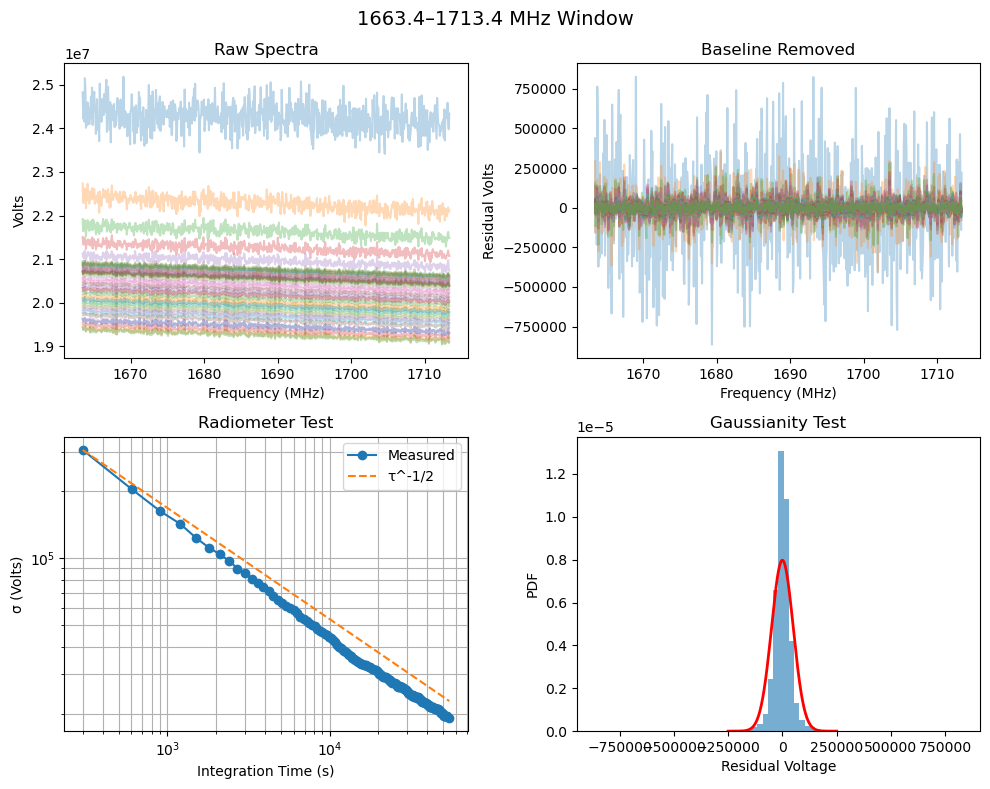

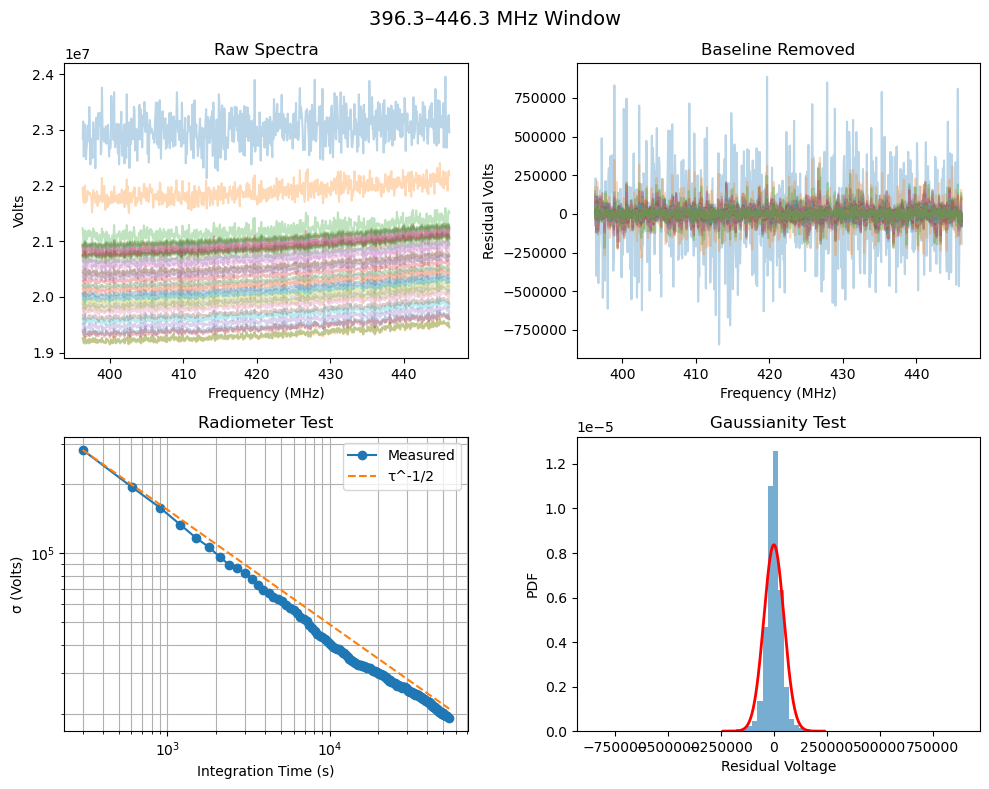

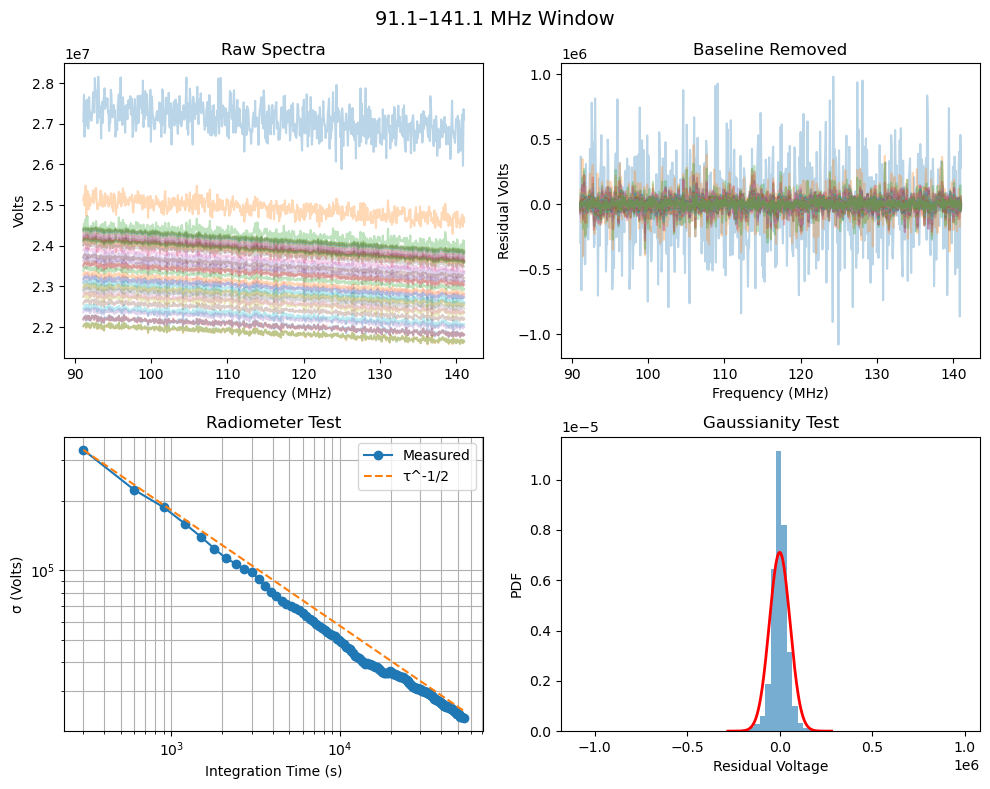

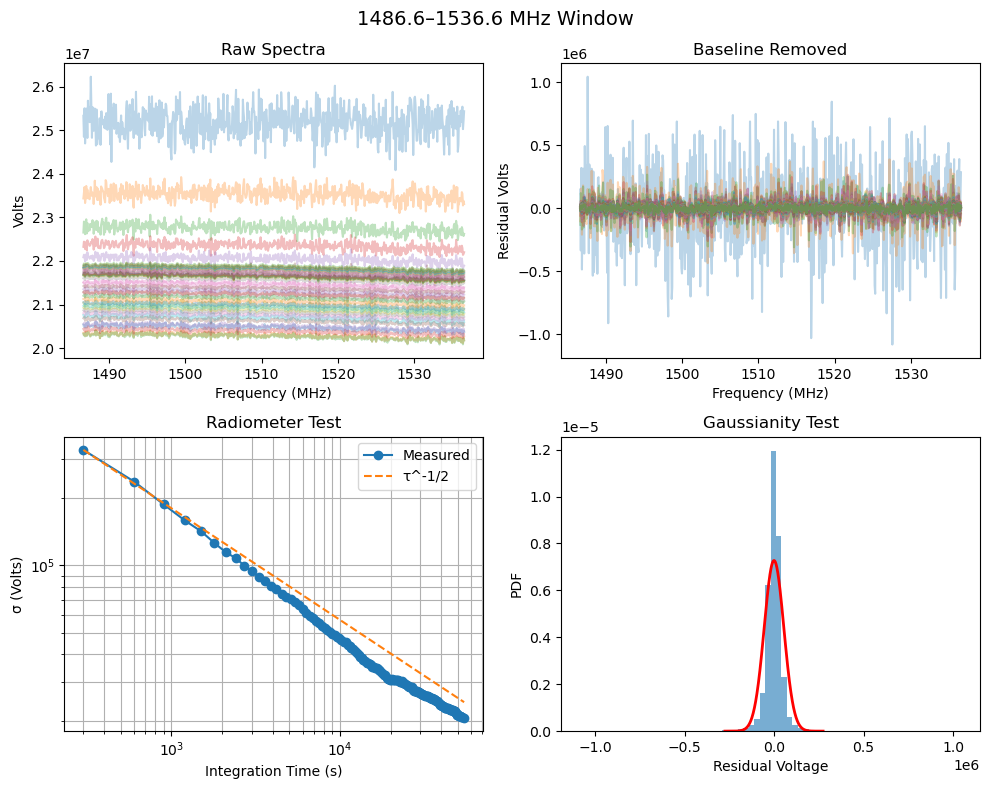

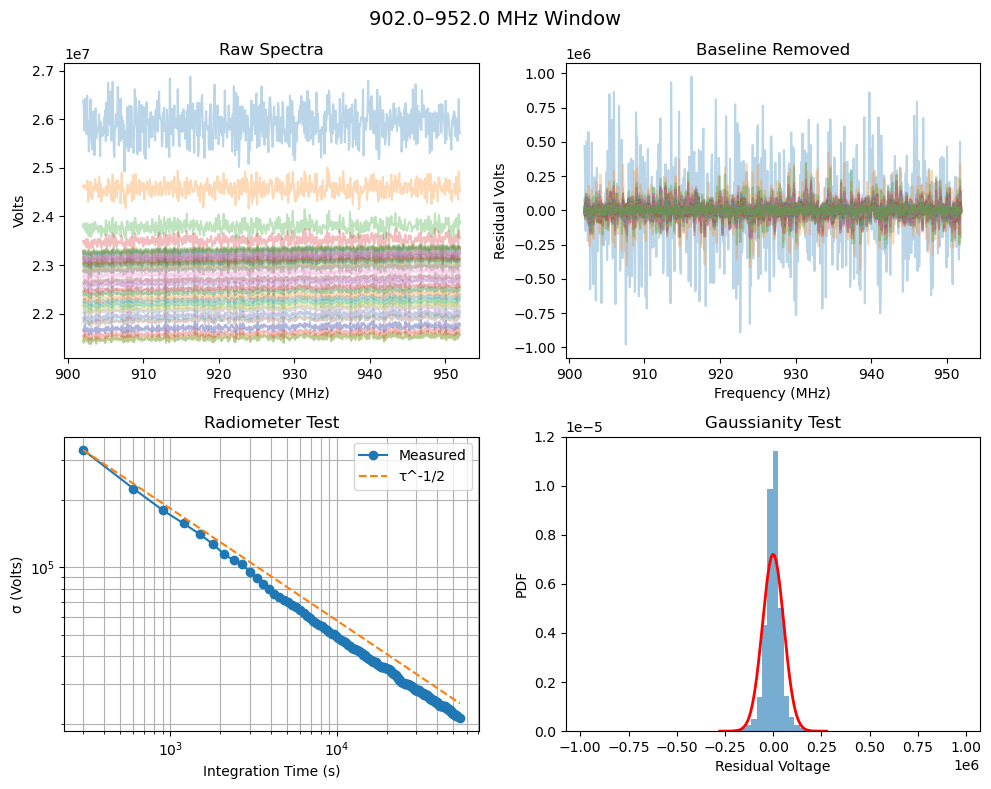

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import random
from scipy.stats import norm

# ================= USER SETTINGS =================
NBITS = 12          # ADC resolution
VFS   = 1.0         # Full-scale voltage (Volts, peak)
WINDOW_MHZ = 50.0   # Width of random analysis window
N_WINDOWS = 6        # How many random slices to analyze
POLY_ORDER = 3       # Bandpass removal polynomial
MAX_LINES = 40       # Max spectra to draw (for readability)
# =================================================


# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale


# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    # sort by elapsed time
    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)

        # running average spectrum at this file
        volts = adu_to_volts(avg[-1])

        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)


# ---------- PICK RANDOM 50 MHz WINDOWS ----------
def pick_windows(F, width, nwin):
    fmin = F.min()
    fmax = F.max() - width
    starts = np.random.uniform(fmin, fmax, nwin)
    return [(s, s + width) for s in starts]


# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]


# ---------- REMOVE BANDPASS ----------
def remove_bandpass(spec2d, order=3):
    cleaned = np.zeros_like(spec2d)
    x = np.arange(spec2d.shape[1])

    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)
        cleaned[i] = row - baseline

    return cleaned


# ---------- RAW EVOLUTION ----------
def plot_raw(ax, Fw, Sw, times):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, Sw[i], alpha=0.3)
    ax.set_title("Raw Spectra")
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel("Volts")


# ---------- NORMALIZED ----------
def plot_normalized(ax, Fw, residuals, times):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, residuals[i], alpha=0.3)
    ax.set_title("Baseline Removed")
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel("Residual Volts")


# ---------- RADIOMETER TEST ----------
def plot_radiometer(ax, times, residuals):
    sigma = np.std(residuals, axis=1)

    ax.loglog(times, sigma, 'o-', label="Measured")

    ref = sigma[0]*(times/times[0])**(-0.5)
    ax.loglog(times, ref, '--', label="τ^-1/2")

    ax.set_title("Radiometer Test")
    ax.set_xlabel("Integration Time (s)")
    ax.set_ylabel("σ (Volts)")
    ax.legend()
    ax.grid(True, which="both")


# ---------- GAUSSIAN TEST ----------
def plot_gaussian(ax, residuals):
    flat = residuals.flatten()
    mu, std = np.mean(flat), np.std(flat)

    ax.hist(flat, bins=70, density=True, alpha=0.6)

    x = np.linspace(mu-5*std, mu+5*std, 400)
    ax.plot(x, norm.pdf(x, mu, std), 'r', lw=2)

    ax.set_title("Gaussianity Test")
    ax.set_xlabel("Residual Voltage")
    ax.set_ylabel("PDF")


# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    windows = pick_windows(F, WINDOW_MHZ, N_WINDOWS)

    for i, (f0, f1) in enumerate(windows):

        Fw, Sw = extract_window(F, spectra, f0, f1)
        residuals = remove_bandpass(Sw, POLY_ORDER)

        fig, axes = plt.subplots(2, 2, figsize=(10,8))
        fig.suptitle(f"{f0:.1f}–{f1:.1f} MHz Window", fontsize=14)

        plot_raw(axes[0,0], Fw, Sw, times)
        plot_normalized(axes[0,1], Fw, residuals, times)
        plot_radiometer(axes[1,0], times, residuals)
        plot_gaussian(axes[1,1], residuals)

        plt.tight_layout()
        plt.show()


# ================= RUN EVERYTHING =================
F, times, spectra = load_dataset(".")
analyze(F, times, spectra)


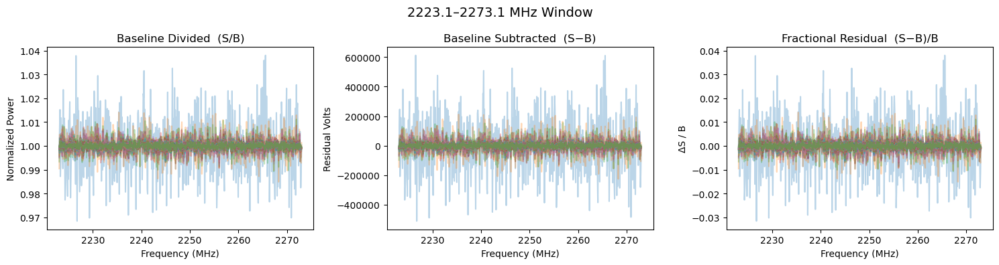

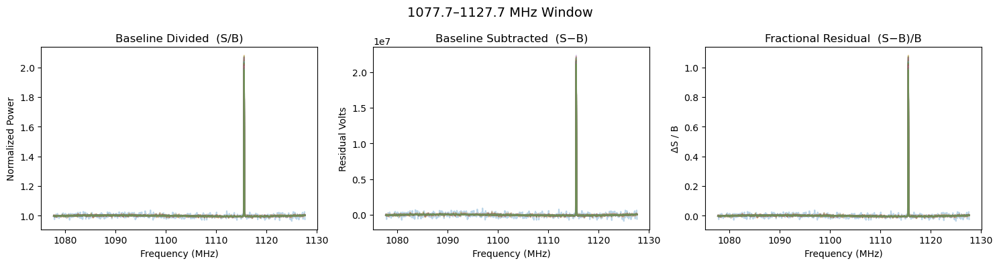

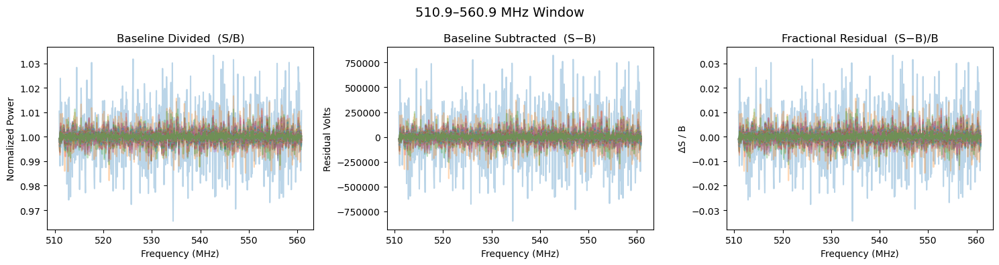

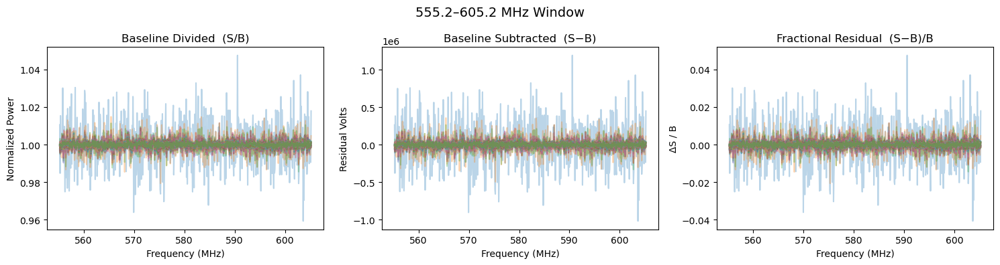

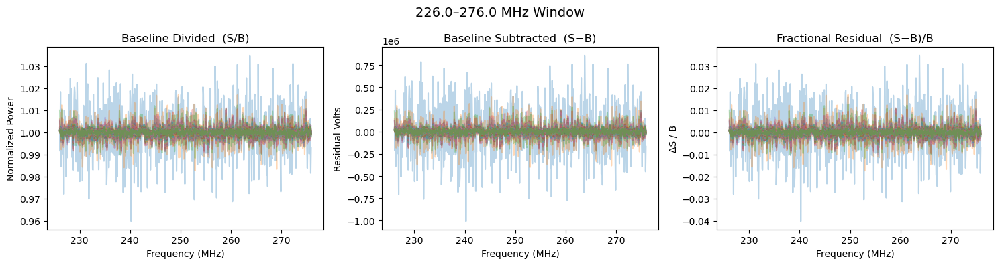

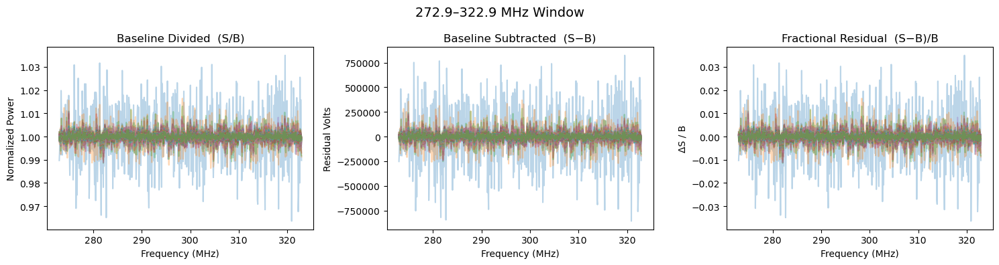

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER SETTINGS =================
NBITS = 12          # ADC resolution
VFS   = 1.0         # Full-scale voltage (Volts, peak)
WINDOW_MHZ = 50.0   # Width of random analysis window
N_WINDOWS = 6       # Number of random slices
POLY_ORDER = 3      # Polynomial order for bandpass fit
MAX_LINES = 40      # Max spectra drawn per panel
# =================================================


# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale


# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)

        volts = adu_to_volts(avg[-1])  # running average spectrum
        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)


# ---------- PICK RANDOM WINDOWS ----------
def pick_windows(F, width, nwin):
    fmin = F.min()
    fmax = F.max() - width
    starts = np.random.uniform(fmin, fmax, nwin)
    return [(s, s + width) for s in starts]


# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]


# ---------- REMOVE BANDPASS (ALL METHODS) ----------
def remove_bandpass_all(spec2d, order=3):
    ntime, nchan = spec2d.shape
    x = np.arange(nchan)

    subtracted = np.zeros_like(spec2d)
    divided    = np.zeros_like(spec2d)
    both       = np.zeros_like(spec2d)

    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)

        subtracted[i] = row - baseline
        divided[i]    = row / baseline
        both[i]       = (row - baseline) / baseline

    return subtracted, divided, both


# ---------- STACKED SPECTRA PLOT ----------
def plot_stack(ax, Fw, data, times, title, ylabel):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, data[i], alpha=0.3)

    ax.set_title(title)
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel(ylabel)


# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    windows = pick_windows(F, WINDOW_MHZ, N_WINDOWS)

    for i, (f0, f1) in enumerate(windows):

        Fw, Sw = extract_window(F, spectra, f0, f1)

        subtracted, divided, both = remove_bandpass_all(Sw, POLY_ORDER)

        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        fig.suptitle(f"{f0:.1f}–{f1:.1f} MHz Window", fontsize=14)

        plot_stack(axes[0], Fw, divided, times,
                   "Baseline Divided  (S/B)", "Normalized Power")

        plot_stack(axes[1], Fw, subtracted, times,
                   "Baseline Subtracted  (S−B)", "Residual Volts")

        plot_stack(axes[2], Fw, both, times,
                   "Fractional Residual  (S−B)/B", "ΔS / B")

        plt.tight_layout()
        plt.show()


# ================= RUN EVERYTHING =================
if __name__ == "__main__":
    F, times, spectra = load_dataset(".")
    analyze(F, times, spectra)

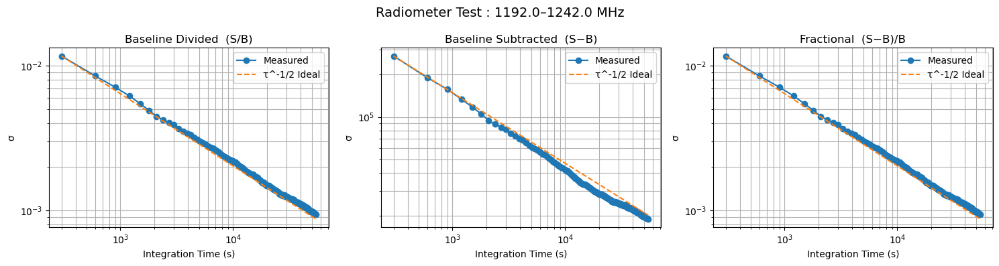

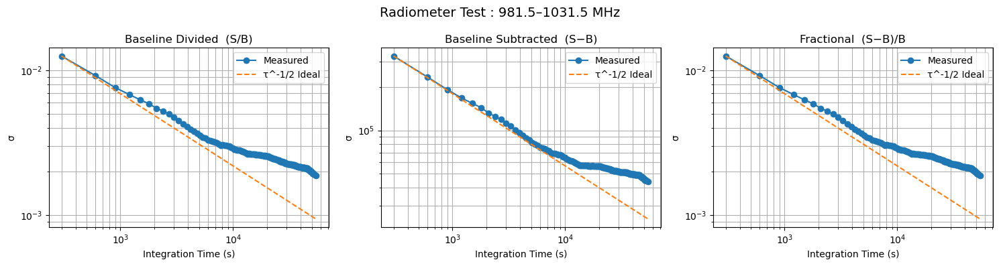

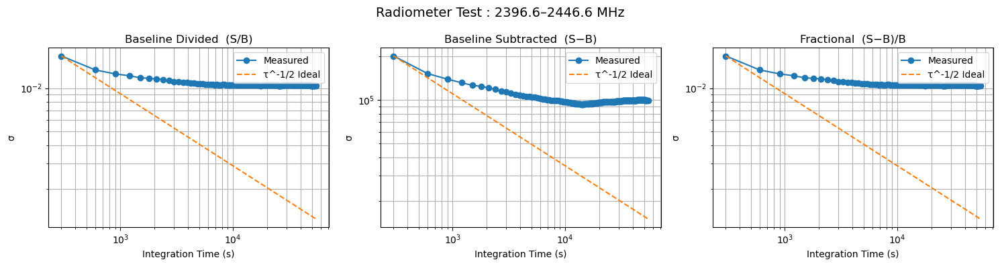

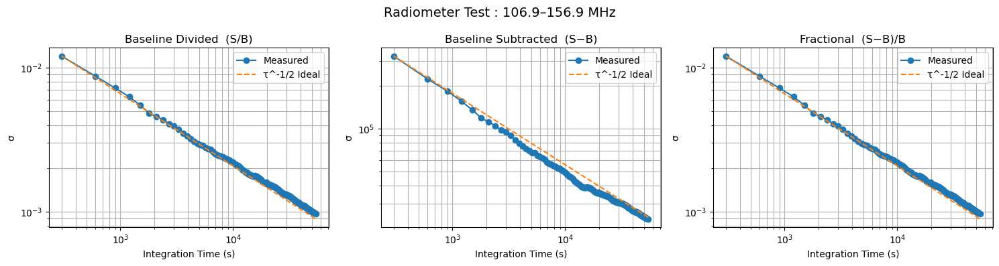

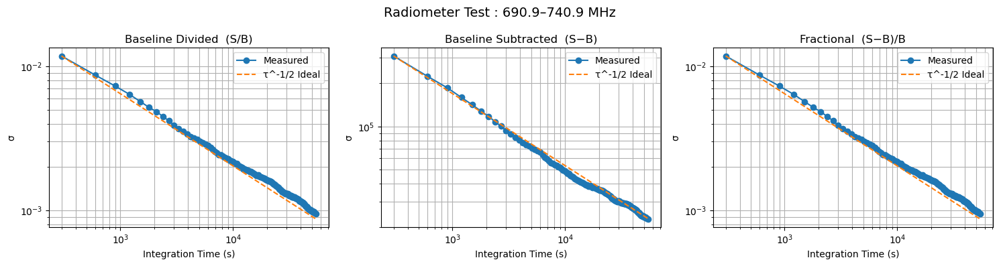

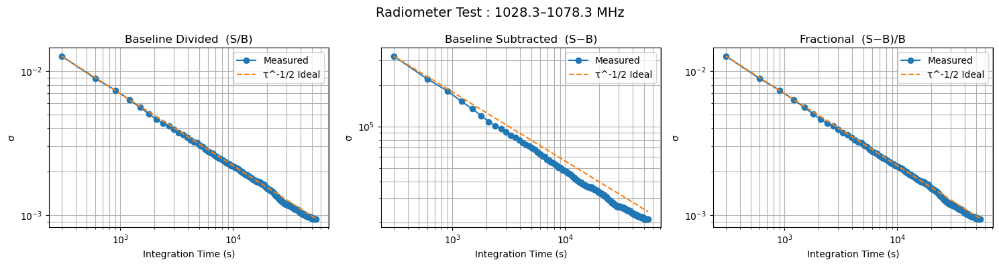

In [5]:

import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER SETTINGS =================
NBITS = 12
VFS   = 1.0
WINDOW_MHZ = 50.0
N_WINDOWS = 6
POLY_ORDER = 3
# =================================================


# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale


# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)

        volts = adu_to_volts(avg[-1])
        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)


# ---------- PICK RANDOM WINDOWS ----------
def pick_windows(F, width, nwin):
    fmin = F.min()
    fmax = F.max() - width
    starts = np.random.uniform(fmin, fmax, nwin)
    return [(s, s + width) for s in starts]


# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]


# ---------- BANDPASS FIT + THREE NORMALIZATIONS ----------
def bandpass_normalizations(spec2d, order=3):
    ntime, nchan = spec2d.shape
    x = np.arange(nchan)

    subtracted = np.zeros_like(spec2d)
    divided    = np.zeros_like(spec2d)
    fractional = np.zeros_like(spec2d)

    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)

        subtracted[i] = row - baseline
        divided[i]    = row / baseline
        fractional[i] = (row - baseline) / baseline

    return subtracted, divided, fractional


# ---------- RADIOMETER SIGMA ----------
def radiometer_sigma(residuals):
    """
    Compute RMS across frequency for each time sample.
    """
    return np.std(residuals, axis=1)


# ---------- PLOT RADIOMETER TEST ----------
def plot_radiometer(ax, times, sigma, title):
    ax.loglog(times, sigma, 'o-', label="Measured")

    ref = sigma[0] * (times / times[0])**(-0.5)
    ax.loglog(times, ref, '--', label="τ^-1/2 Ideal")

    ax.set_title(title)
    ax.set_xlabel("Integration Time (s)")
    ax.set_ylabel("σ")
    ax.grid(True, which="both")
    ax.legend()


# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    windows = pick_windows(F, WINDOW_MHZ, N_WINDOWS)

    for (f0, f1) in windows:

        Fw, Sw = extract_window(F, spectra, f0, f1)

        subtracted, divided, fractional = bandpass_normalizations(Sw, POLY_ORDER)

        sigma_sub = radiometer_sigma(subtracted)
        sigma_div = radiometer_sigma(divided)
        sigma_frc = radiometer_sigma(fractional)

        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        fig.suptitle(f"Radiometer Test : {f0:.1f}–{f1:.1f} MHz", fontsize=14)

        plot_radiometer(axes[0], times, sigma_div,
                        "Baseline Divided  (S/B)")

        plot_radiometer(axes[1], times, sigma_sub,
                        "Baseline Subtracted  (S−B)")

        plot_radiometer(axes[2], times, sigma_frc,
                        "Fractional  (S−B)/B")

        plt.tight_layout()
        plt.show()


# ================= RUN EVERYTHING =================
if __name__ == "__main__":
    F, times, spectra = load_dataset(".")
    analyze(F, times, spectra)


Window 1527.3-1577.3 MHz
 RAW slope: -0.177  FAIL
 S/B slope: -0.521  PASS
 S-B slope: -0.536  PASS
 (S-B)/B slope: -0.521  PASS


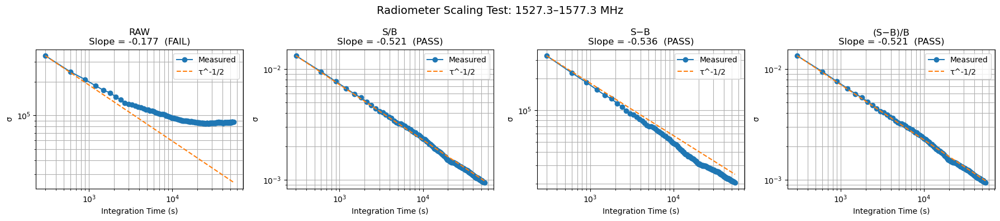


Window 1468.0-1518.0 MHz
 RAW slope: -0.441  PASS
 S/B slope: -0.500  PASS
 S-B slope: -0.514  PASS
 (S-B)/B slope: -0.500  PASS


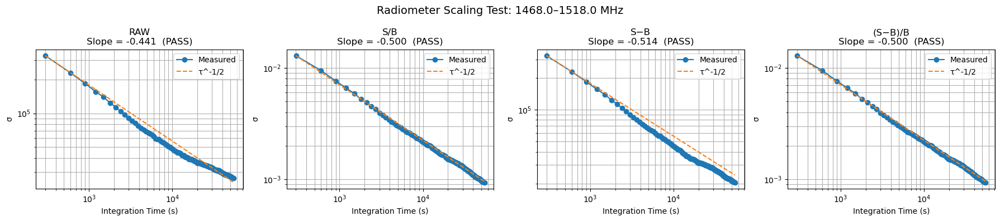


Window 255.0-305.0 MHz
 RAW slope: -0.040  FAIL
 S/B slope: -0.481  PASS
 S-B slope: -0.485  PASS
 (S-B)/B slope: -0.481  PASS


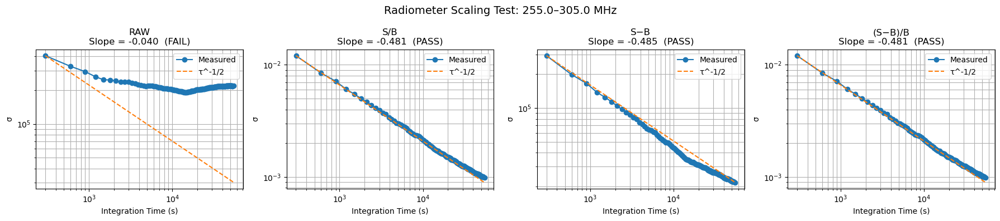


Window 1781.2-1831.2 MHz
 RAW slope: -0.018  FAIL
 S/B slope: -0.494  PASS
 S-B slope: -0.509  PASS
 (S-B)/B slope: -0.494  PASS


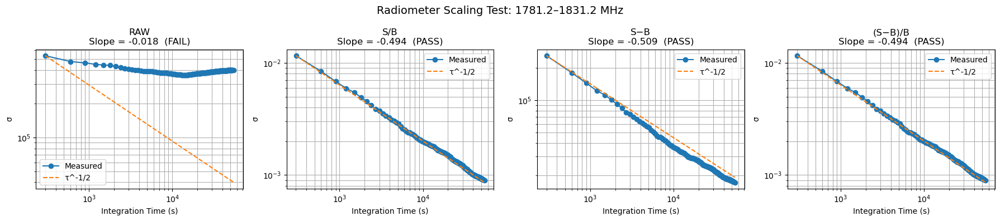


Window 1593.8-1643.8 MHz
 RAW slope: -0.130  FAIL
 S/B slope: -0.495  PASS
 S-B slope: -0.510  PASS
 (S-B)/B slope: -0.495  PASS


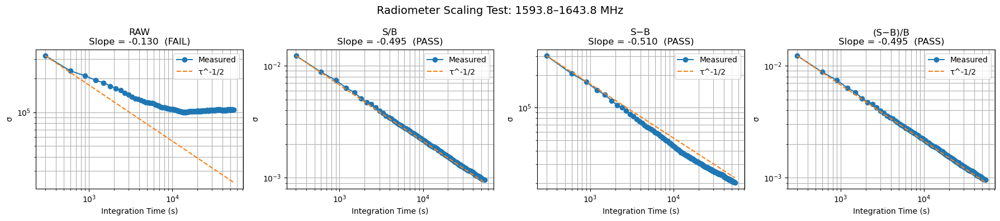


Window 2362.4-2412.4 MHz
 RAW slope: -0.028  FAIL
 S/B slope: -0.190  FAIL
 S-B slope: -0.208  FAIL
 (S-B)/B slope: -0.190  FAIL


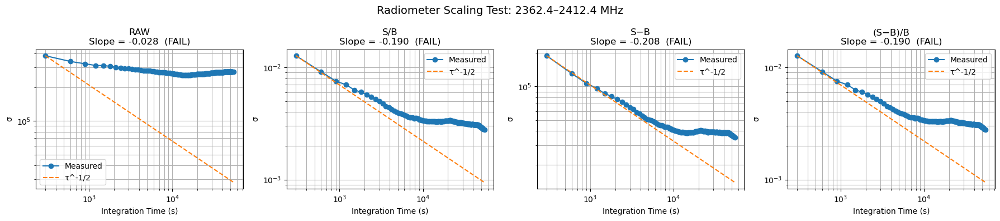

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER SETTINGS =================
NBITS = 12
VFS   = 1.0
WINDOW_MHZ = 50.0
N_WINDOWS = 6
POLY_ORDER = 3
SLOPE_TOL = 0.08   # acceptable deviation from -0.5
# =================================================


# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale


# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)

        volts = adu_to_volts(avg[-1])
        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)


# ---------- PICK RANDOM WINDOWS ----------
def pick_windows(F, width, nwin):
    fmin = F.min()
    fmax = F.max() - width
    starts = np.random.uniform(fmin, fmax, nwin)
    return [(s, s + width) for s in starts]


# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]


# ---------- BANDPASS NORMALIZATIONS ----------
def bandpass_normalizations(spec2d, order=3):
    ntime, nchan = spec2d.shape
    x = np.arange(nchan)

    subtracted = np.zeros_like(spec2d)
    divided    = np.zeros_like(spec2d)
    fractional = np.zeros_like(spec2d)

    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)

        subtracted[i] = row - baseline
        divided[i]    = row / baseline
        fractional[i] = (row - baseline) / baseline

    return subtracted, divided, fractional


# ---------- COMPUTE RMS ----------
def radiometer_sigma(data2d):
    return np.std(data2d, axis=1)


# ---------- FIT LOG-LOG SLOPE ----------
def fit_slope(times, sigma):
    logt = np.log10(times)
    logs = np.log10(sigma)

    coeffs = np.polyfit(logt, logs, 1)
    slope = coeffs[0]
    return slope


# ---------- PLOT + FIT ----------
def plot_radiometer(ax, times, sigma, title):
    ax.loglog(times, sigma, 'o-', label="Measured")

    ref = sigma[0] * (times / times[0])**(-0.5)
    ax.loglog(times, ref, '--', label="τ^-1/2")

    slope = fit_slope(times, sigma)
    status = "PASS" if abs(slope + 0.5) < SLOPE_TOL else "FAIL"

    ax.set_title(f"{title}\nSlope = {slope:.3f}  ({status})")
    ax.set_xlabel("Integration Time (s)")
    ax.set_ylabel("σ")
    ax.grid(True, which="both")
    ax.legend()

    return slope, status


# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    windows = pick_windows(F, WINDOW_MHZ, N_WINDOWS)

    for (f0, f1) in windows:

        Fw, Sw = extract_window(F, spectra, f0, f1)

        sigma_raw = radiometer_sigma(Sw)

        subtracted, divided, fractional = bandpass_normalizations(Sw, POLY_ORDER)

        sigma_div = radiometer_sigma(divided)
        sigma_sub = radiometer_sigma(subtracted)
        sigma_frc = radiometer_sigma(fractional)

        fig, axes = plt.subplots(1, 4, figsize=(18, 4))
        fig.suptitle(f"Radiometer Scaling Test: {f0:.1f}–{f1:.1f} MHz", fontsize=14)

        s0 = plot_radiometer(axes[0], times, sigma_raw, "RAW")
        s1 = plot_radiometer(axes[1], times, sigma_div, "S/B")
        s2 = plot_radiometer(axes[2], times, sigma_sub, "S−B")
        s3 = plot_radiometer(axes[3], times, sigma_frc, "(S−B)/B")

        print(f"\nWindow {f0:.1f}-{f1:.1f} MHz")
        print(f" RAW slope: {s0[0]:.3f}  {s0[1]}")
        print(f" S/B slope: {s1[0]:.3f}  {s1[1]}")
        print(f" S-B slope: {s2[0]:.3f}  {s2[1]}")
        print(f" (S-B)/B slope: {s3[0]:.3f}  {s3[1]}")

        plt.tight_layout()
        plt.show()


# ================= RUN =================
if __name__ == "__main__":
    F, times, spectra = load_dataset(".")
    analyze(F, times, spectra)

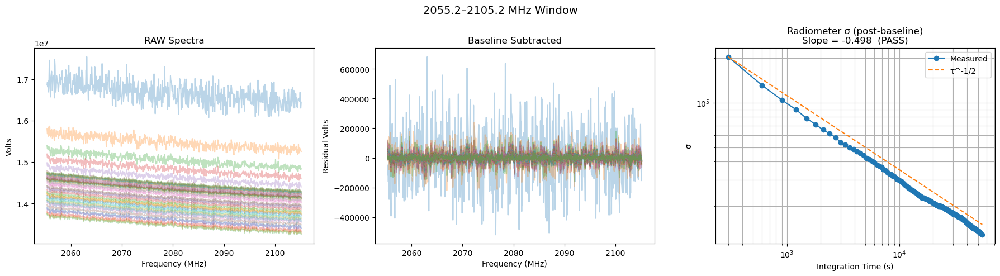


Window 2055.2-2105.2 MHz
 RAW σ slope: -0.053
 Subtracted σ slope: -0.498


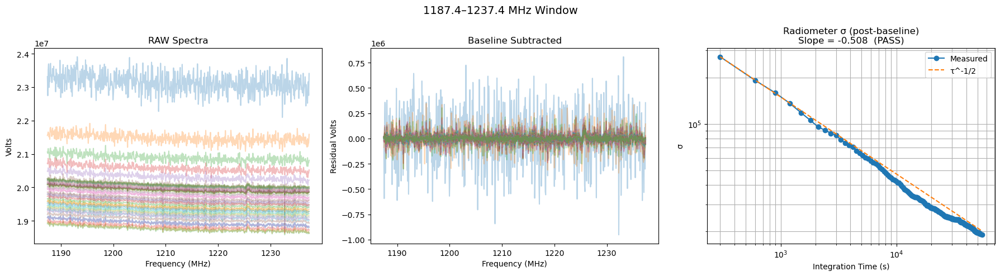


Window 1187.4-1237.4 MHz
 RAW σ slope: -0.192
 Subtracted σ slope: -0.508


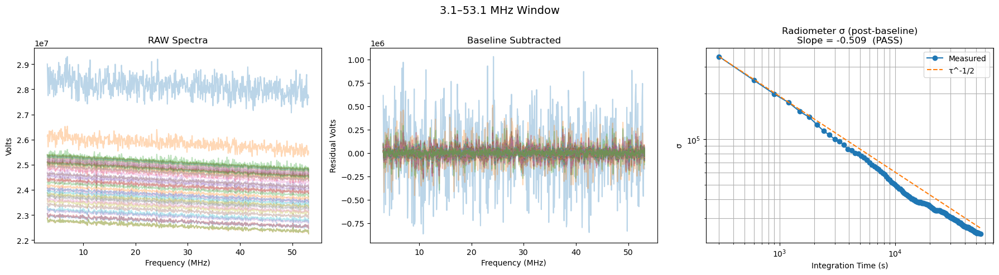


Window 3.1-53.1 MHz
 RAW σ slope: -0.054
 Subtracted σ slope: -0.509


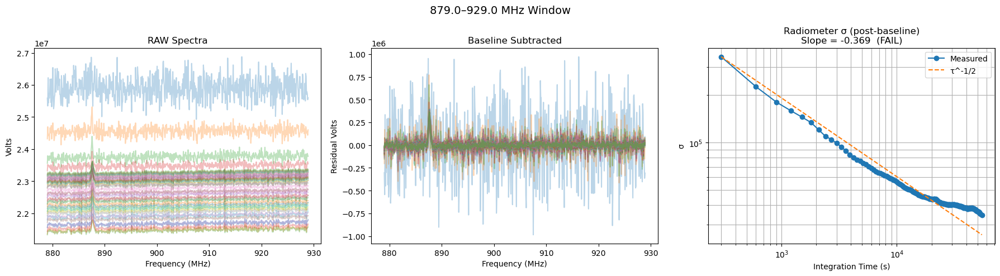


Window 879.0-929.0 MHz
 RAW σ slope: -0.285
 Subtracted σ slope: -0.369


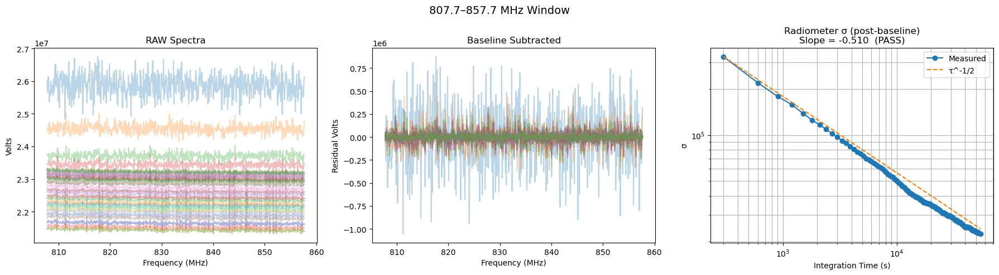


Window 807.7-857.7 MHz
 RAW σ slope: -0.416
 Subtracted σ slope: -0.510


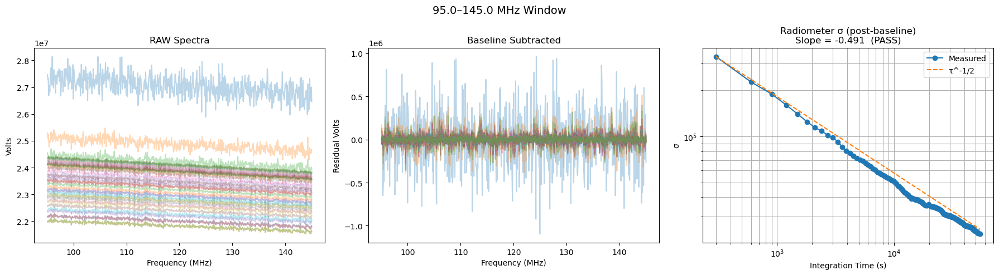


Window 95.0-145.0 MHz
 RAW σ slope: -0.051
 Subtracted σ slope: -0.491


In [7]:
import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER SETTINGS =================
NBITS = 12          # ADC resolution
VFS   = 1.0         # Full-scale voltage (Volts, peak)
WINDOW_MHZ = 50.0   # Width of random analysis window
N_WINDOWS = 6       # Number of random slices
POLY_ORDER = 3      # Polynomial order for bandpass fit
MAX_LINES = 40      # Max spectra drawn per panel
SLOPE_TOL = 0.08    # acceptable deviation from -0.5
# =================================================

# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale

# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)
        if F is None:
            F = d["F"]
        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)
        volts = adu_to_volts(avg[-1])
        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)

# ---------- PICK RANDOM WINDOWS ----------
def pick_windows(F, width, nwin):
    fmin = F.min()
    fmax = F.max() - width
    starts = np.random.uniform(fmin, fmax, nwin)
    return [(s, s + width) for s in starts]

# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]

# ---------- BASELINE SUBTRACTION ----------
def baseline_subtract(spec2d, order=3):
    ntime, nchan = spec2d.shape
    x = np.arange(nchan)
    subtracted = np.zeros_like(spec2d)
    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)
        subtracted[i] = row - baseline
    return subtracted

# ---------- COMPUTE RMS ----------
def radiometer_sigma(data2d):
    return np.std(data2d, axis=1)

# ---------- FIT LOG-LOG SLOPE ----------
def fit_slope(times, sigma):
    logt = np.log10(times)
    logs = np.log10(sigma)
    coeffs = np.polyfit(logt, logs, 1)
    slope = coeffs[0]
    return slope

# ---------- STACKED SPECTRA PLOT ----------
def plot_stack(ax, Fw, data, times, title, ylabel):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, data[i], alpha=0.3)
    ax.set_title(title)
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel(ylabel)

# ---------- PLOT + FIT ----------
def plot_radiometer(ax, times, sigma, title):
    ax.loglog(times, sigma, 'o-', label="Measured")
    ref = sigma[0] * (times / times[0])**(-0.5)
    ax.loglog(times, ref, '--', label="τ^-1/2")
    slope = fit_slope(times, sigma)
    status = "PASS" if abs(slope + 0.5) < SLOPE_TOL else "FAIL"
    ax.set_title(f"{title}\nSlope = {slope:.3f}  ({status})")
    ax.set_xlabel("Integration Time (s)")
    ax.set_ylabel("σ")
    ax.grid(True, which="both")
    ax.legend()
    return slope, status

# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    windows = pick_windows(F, WINDOW_MHZ, N_WINDOWS)

    for f0, f1 in windows:

        Fw, Sw = extract_window(F, spectra, f0, f1)

        subtracted = baseline_subtract(Sw, POLY_ORDER)
        sigma_raw = radiometer_sigma(Sw)
        sigma_sub = radiometer_sigma(subtracted)

        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f"{f0:.1f}–{f1:.1f} MHz Window", fontsize=14)

        plot_stack(axes[0], Fw, Sw, times, "RAW Spectra", "Volts")
        plot_stack(axes[1], Fw, subtracted, times, "Baseline Subtracted", "Residual Volts")
        plot_radiometer(axes[2], times, sigma_sub, "Radiometer σ (post-baseline)")

        plt.tight_layout()
        plt.show()

        s_raw = fit_slope(times, sigma_raw)
        s_sub = fit_slope(times, sigma_sub)
        print(f"\nWindow {f0:.1f}-{f1:.1f} MHz")
        print(f" RAW σ slope: {s_raw:.3f}")
        print(f" Subtracted σ slope: {s_sub:.3f}")

# ================= RUN =================
if __name__ == "__main__":
    F, times, spectra = load_dataset(".")
    analyze(F, times, spectra)

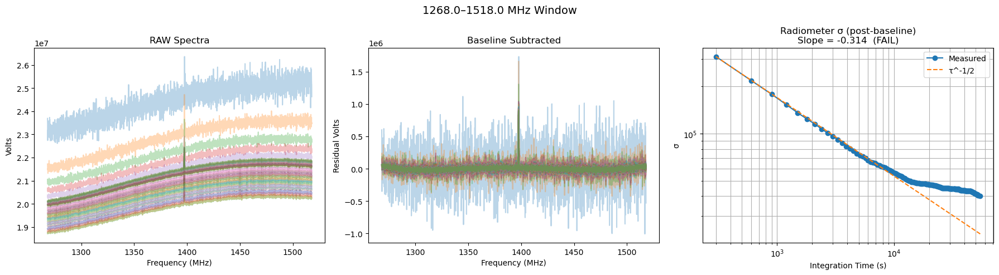


Window 1268.0-1518.0 MHz
 RAW σ slope: -0.026
 Subtracted σ slope: -0.314


In [8]:
import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER SETTINGS =================
NBITS = 12          # ADC resolution
VFS   = 1.0         # Full-scale voltage (Volts, peak)
POLY_ORDER = 3      # Polynomial order for bandpass fit
MAX_LINES = 40      # Max spectra drawn per panel
SLOPE_TOL = 0.08    # acceptable deviation from -0.5
# =================================================

# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale

# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)
        if F is None:
            F = d["F"]
        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)
        volts = adu_to_volts(avg[-1])
        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)

# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]

# ---------- BASELINE SUBTRACTION ----------
def baseline_subtract(spec2d, order=3):
    ntime, nchan = spec2d.shape
    x = np.arange(nchan)
    subtracted = np.zeros_like(spec2d)
    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)
        subtracted[i] = row - baseline
    return subtracted

# ---------- COMPUTE RMS ----------
def radiometer_sigma(data2d):
    return np.std(data2d, axis=1)

# ---------- FIT LOG-LOG SLOPE ----------
def fit_slope(times, sigma):
    logt = np.log10(times)
    logs = np.log10(sigma)
    coeffs = np.polyfit(logt, logs, 1)
    slope = coeffs[0]
    return slope

# ---------- STACKED SPECTRA PLOT ----------
def plot_stack(ax, Fw, data, times, title, ylabel):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, data[i], alpha=0.3)
    ax.set_title(title)
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel(ylabel)

# ---------- PLOT + FIT ----------
def plot_radiometer(ax, times, sigma, title):
    ax.loglog(times, sigma, 'o-', label="Measured")
    ref = sigma[0] * (times / times[0])**(-0.5)
    ax.loglog(times, ref, '--', label="τ^-1/2")
    slope = fit_slope(times, sigma)
    status = "PASS" if abs(slope + 0.5) < SLOPE_TOL else "FAIL"
    ax.set_title(f"{title}\nSlope = {slope:.3f}  ({status})")
    ax.set_xlabel("Integration Time (s)")
    ax.set_ylabel("σ")
    ax.grid(True, which="both")
    ax.legend()
    return slope, status

# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    # FIXED WINDOW
    f0, f1 = 1268.0, 1518.0
    Fw, Sw = extract_window(F, spectra, f0, f1)

    subtracted = baseline_subtract(Sw, POLY_ORDER)
    sigma_raw = radiometer_sigma(Sw)
    sigma_sub = radiometer_sigma(subtracted)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"{f0:.1f}–{f1:.1f} MHz Window", fontsize=14)

    plot_stack(axes[0], Fw, Sw, times, "RAW Spectra", "Volts")
    plot_stack(axes[1], Fw, subtracted, times, "Baseline Subtracted", "Residual Volts")
    plot_radiometer(axes[2], times, sigma_sub, "Radiometer σ (post-baseline)")

    plt.tight_layout()
    plt.show()

    s_raw = fit_slope(times, sigma_raw)
    s_sub = fit_slope(times, sigma_sub)
    print(f"\nWindow {f0:.1f}-{f1:.1f} MHz")
    print(f" RAW σ slope: {s_raw:.3f}")
    print(f" Subtracted σ slope: {s_sub:.3f}")

# ================= RUN =================
if __name__ == "__main__":
    F, times, spectra = load_dataset(".")
    analyze(F, times, spectra)

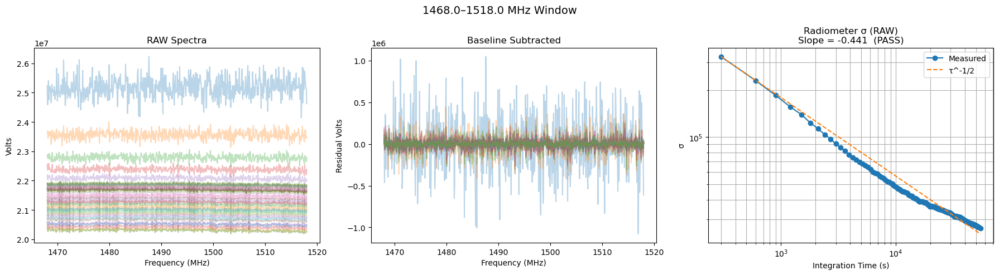


Window 1468.0-1518.0 MHz
 RAW σ slope: -0.441


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER SETTINGS =================
NBITS = 12          # ADC resolution
VFS   = 1.0         # Full-scale voltage (Volts, peak)
POLY_ORDER = 3      # Polynomial order for bandpass fit
MAX_LINES = 40      # Max spectra drawn per panel
SLOPE_TOL = 0.08    # acceptable deviation from -0.5
# =================================================

# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale

# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)
        if F is None:
            F = d["F"]
        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)
        volts = adu_to_volts(avg[-1])
        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)

# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]

# ---------- BASELINE SUBTRACTION ----------
def baseline_subtract(spec2d, order=3):
    ntime, nchan = spec2d.shape
    x = np.arange(nchan)
    subtracted = np.zeros_like(spec2d)
    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)
        subtracted[i] = row - baseline
    return subtracted

# ---------- COMPUTE RMS ----------
def radiometer_sigma(data2d):
    return np.std(data2d, axis=1)

# ---------- FIT LOG-LOG SLOPE ----------
def fit_slope(times, sigma):
    logt = np.log10(times)
    logs = np.log10(sigma)
    coeffs = np.polyfit(logt, logs, 1)
    slope = coeffs[0]
    return slope

# ---------- STACKED SPECTRA PLOT ----------
def plot_stack(ax, Fw, data, times, title, ylabel):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, data[i], alpha=0.3)
    ax.set_title(title)
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel(ylabel)

# ---------- PLOT + FIT ----------
def plot_radiometer(ax, times, sigma, title):
    ax.loglog(times, sigma, 'o-', label="Measured")
    ref = sigma[0] * (times / times[0])**(-0.5)
    ax.loglog(times, ref, '--', label="τ^-1/2")
    slope = fit_slope(times, sigma)
    status = "PASS" if abs(slope + 0.5) < SLOPE_TOL else "FAIL"
    ax.set_title(f"{title}\nSlope = {slope:.3f}  ({status})")
    ax.set_xlabel("Integration Time (s)")
    ax.set_ylabel("σ")
    ax.grid(True, which="both")
    ax.legend()
    return slope, status

# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    # FIXED WINDOW
    f0, f1 = 1468.0, 1518.0
    Fw, Sw = extract_window(F, spectra, f0, f1)

    # Baseline-subtracted spectra for visualization
    subtracted = baseline_subtract(Sw, POLY_ORDER)

    # Compute sigma using raw (pre-baseline subtraction) data
    sigma_raw = radiometer_sigma(Sw)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"{f0:.1f}–{f1:.1f} MHz Window", fontsize=14)

    plot_stack(axes[0], Fw, Sw, times, "RAW Spectra", "Volts")
    plot_stack(axes[1], Fw, subtracted, times, "Baseline Subtracted", "Residual Volts")
    plot_radiometer(axes[2], times, sigma_raw, "Radiometer σ (RAW)")

    plt.tight_layout()
    plt.show()

    s_raw = fit_slope(times, sigma_raw)
    print(f"\nWindow {f0:.1f}-{f1:.1f} MHz")
    print(f" RAW σ slope: {s_raw:.3f}")

# ================= RUN =================
if __name__ == "__main__":
    F, times, spectra = load_dataset(".")
    analyze(F, times, spectra)